<a href="https://colab.research.google.com/github/ishahmshah1025/SIH-24/blob/main/YOLO_v8_CV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Image recognition of infrastructure and faculties

Install required dependencies:

Importing model to be used:

In [1]:
from ultralytics import YOLO

In [2]:
model = YOLO("yolov8l.pt")

#Applying model to dataset of classrooms



Specifying path from which to refer to images:

In [3]:
import os
#note to editor: directory path has been specified after mounting drive,
#save dataset to drive and mount it before running the code
directory_path = '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class'
#initialising empty list to store all images
image_files = []

In [4]:
print(model.names)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [5]:
#looping to store every image in directory to list
for filename in os.listdir(directory_path):
    if filename.endswith('.jpg') or filename.endswith('.png') or filename.endswith('.jpeg'):
        image_files.append(os.path.join(directory_path, filename))

In [6]:
print(image_files)
image_names = [os.path.basename(path) for path in image_files]
print(image_names)

['/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class/class2.jpg']
['class2.jpg']


In [7]:
result_files = []

Implementing model for every image in directory:

In [8]:
for image_file in image_files:
  results = model.predict(image_file)
  #initialising dictionary to store objects and count
  x = {}
  for result in results:
    for box in result.boxes:
      label = result.names[int(box.cls)]
      #looping to store object label and count
      if label in x:
        x[label] += 1
      else:
        x[label] = 1

    result_files.append({image_file: x})


image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class/class2.jpg: 640x384 14 benchs, 40.2ms
Speed: 4.3ms preprocess, 40.2ms inference, 148.9ms postprocess per image at shape (1, 3, 640, 384)


In [9]:
for result in result_files:
  print(result)

{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class/class2.jpg': {'bench': 14}}


Accounting for errors:
As noticed, the model tends to identify some benches as dining tables. To rectify that, we add the count of dining tables to that of benches, and delete dining tables.

In [10]:
for result in result_files:
    for image_file, x in result.items():
        if 'dining table' in x:
            if 'bench' in x:
                x['bench'] += x['dining table']
            else:
                x['bench'] = x['dining table']

In [11]:
for result in result_files:
  print(result)

{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class/class2.jpg': {'bench': 14}}


In [12]:
for result in result_files:
  for image_file, x in result.items():
    if 'dining table' in x:
      del x['dining table']

for result in result_files:
  print(result)

{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class/class2.jpg': {'bench': 14}}


Showing output image result:


image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/class/class2.jpg: 640x384 14 benchs, 203.7ms
Speed: 4.3ms preprocess, 203.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 384)


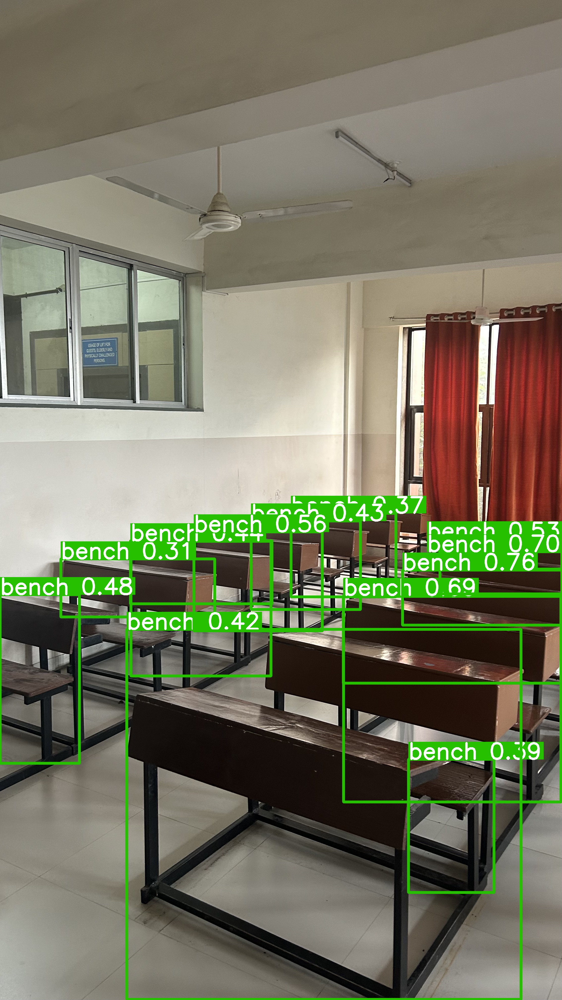

In [13]:
# Iterate through each result in the results_list
for result in result_files:
    for image_file, x in result.items():
        # Run the model on the current image file
        image_results = model.predict(image_file)

        # Process each result in image_results
        for image_result in image_results:
            boxes = image_result.boxes  # Boxes object for bounding box outputs
            masks = image_result.masks  # Masks object for segmentation masks outputs
            keypoints = image_result.keypoints  # Keypoints object for pose outputs
            probs = image_result.probs  # Probs object for classification outputs
            obb = image_result.obb  # Oriented boxes object for OBB outputs

            # Display the result
            image_result.show()  # display to screen

            # Save the result to disk, appending the original image file name
            output_filename = f"result_{os.path.basename(image_file)}"
            image_result.save(filename=output_filename)  # save to disk


In [134]:
#taking input from management in frontend
print("Enter branch:")
branch = input()
print("Enter intake:")
branch_intake = int(input())
print("Enter number of divisions:")
no_div = int(input())
print("Enter number of batches:")
no_batches = int(input())
threshold_class = (branch_intake/no_div)/2
threshold_lab = (branch_intake/no_div)/no_batches

Enter branch:
Enter intake:
Enter number of divisions:
Enter number of batches:


Checks if images input to model meet requirements:

In [135]:
statuses_c = []
recommendations_c = []
for result in result_files:
  for image_file, x in result.items():
    if 'bench' in x:
      classroom = True
      count = x['bench']
      if count+16 < threshold_class:
        missing = threshold_class - (count+16)
        print("Insufficient equipment.")
        print("Recommended: Get", missing, "more benches.")
        status1 = 'Insufficient equipment'
        recommendation1 = f'Get {missing:.0f} more benches.'
      else:
        print("Sufficient equipment.")
        status1 = 'Sufficient equipment'
        recommendation1 = '-'
      statuses_c.append(status1)
      recommendations_c.append(recommendation1)
      break
    else:
      classroom = False
      print("Input image of classroom only:",image_file)

Sufficient equipment.
Sufficient equipment.
Insufficient equipment.
Recommended: Get 5.0 more benches.
Sufficient equipment.
Sufficient equipment.
Insufficient equipment.
Recommended: Get 8.0 more benches.


#Applying model to dataset of labs:

In [136]:
import os
#note to editor: directory path has been specified after mounting drive,
#save dataset to drive and mount it before running the code
directory_path1 = '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab'
#initialising empty list to store all images
image_files1 = []

In [137]:
#looping to store every image in directory to list
for filename in os.listdir(directory_path1):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_files1.append(os.path.join(directory_path1, filename))

In [138]:
print(image_files1)
image_names1 = [os.path.basename(path) for path in image_files1]
print(image_names1)

['/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab1.jpg', '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab2.jpg', '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab3.jpg', '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab4.jpg', '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab5.jpg', '/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab6.jpg']
['lab1.jpg', 'lab2.jpg', 'lab3.jpg', 'lab4.jpg', 'lab5.jpg', 'lab6.jpg']


In [139]:
result_files1 = []

In [140]:
for image_file in image_files1:
  results1 = model.predict(image_file)
  #initialising dictionary to store objects and count
  y = {}
  for result in results1:
    for box in result.boxes:
      label = result.names[int(box.cls)]
      #looping to store object label and count
      if label in y:
        y[label] += 1
      else:
        y[label] = 1

    result_files1.append({image_file: y})


image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab1.jpg: 480x640 15 chairs, 10 tvs, 2 mouses, 5 keyboards, 230.3ms
Speed: 7.5ms preprocess, 230.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab2.jpg: 480x640 1 bird, 17 chairs, 7 tvs, 17.9ms
Speed: 3.0ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab3.jpg: 480x640 2 persons, 15 chairs, 12 tvs, 1 keyboard, 16.5ms
Speed: 1.8ms preprocess, 16.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab4.jpg: 640x480 8 chairs, 9 tvs, 18.9ms
Speed: 1.8ms preprocess, 18.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab

In [141]:
for result in result_files1:
  print(result)

{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab1.jpg': {'keyboard': 5, 'chair': 15, 'mouse': 2, 'tv': 10}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab2.jpg': {'chair': 17, 'tv': 7, 'bird': 1}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab3.jpg': {'chair': 15, 'tv': 12, 'person': 2, 'keyboard': 1}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab4.jpg': {'chair': 8, 'tv': 9}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab5.jpg': {'chair': 13, 'tv': 8}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab6.jpg': {'keyboard': 5, 'chair': 13, 'scissors': 1, 'tv': 7, 'mouse': 1}}


In [142]:
for result in result_files1:
    for image_file, y in result.items():
        if 'tv' in y:
            if 'monitor' in y:
                y['monitor'] += y['tv']
            else:
                y['monitor'] = y['tv']
            del y['tv']
        if 'laptop' in y:
            if 'monitor' in y:
                y['monitor'] += y['laptop']
            else:
                y['monitor'] = y['laptop']
            del y['laptop']

In [143]:
for result in result_files1:
  print(result)

{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab1.jpg': {'keyboard': 5, 'chair': 15, 'mouse': 2, 'monitor': 10}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab2.jpg': {'chair': 17, 'bird': 1, 'monitor': 7}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab3.jpg': {'chair': 15, 'person': 2, 'keyboard': 1, 'monitor': 12}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab4.jpg': {'chair': 8, 'monitor': 9}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab5.jpg': {'chair': 13, 'monitor': 8}}
{'/mnt/e/Programming/SIH_24/yolo/testing_images for yolo model/lab/lab6.jpg': {'keyboard': 5, 'chair': 13, 'scissors': 1, 'mouse': 1, 'monitor': 7}}


In [144]:
statuses = []
recommendations = []
for result in result_files1:
    for image_file, y in result.items():
        if 'monitor' in y:
            count = y['monitor']
            if count+6 < threshold_lab:
                print("Insufficient equipment.")
                print("Recommended: Get", missing, "more monitors.")
                missing = threshold_lab - (count+6)
                status = 'Insufficient equipment'
                recommendation = f'Get {missing:.0f} more monitors.'
            else:
                print("Sufficient equipment.")
                status = 'Sufficient equipment'
                recommendation = '-'
            statuses.append(status)
            recommendations.append(recommendation)
            break
        else:
            status = 'Not a lab'
            recommendation = ''
            statuses.append(status)
            recommendations.append(recommendation)
            print("Input image is not a lab:", image_file)

Sufficient equipment.
Insufficient equipment.
Recommended: Get 8.0 more monitors.
Sufficient equipment.
Sufficient equipment.
Insufficient equipment.
Recommended: Get 2.0 more monitors.
Insufficient equipment.
Recommended: Get 1.0 more monitors.


In [168]:
from reportlab.lib import colors
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Table, TableStyle, Paragraph, Spacer
from reportlab.lib.styles import getSampleStyleSheet
from reportlab.lib.units import inch

# Example data
class_date = list(zip(image_names, statuses_c, recommendations_c))
lab_data = list(zip(image_names1, statuses, recommendations))

# Create a PDF document
pdf_file = 'deficiency_report.pdf'
doc = SimpleDocTemplate(pdf_file, pagesize=letter)

# Container for the 'Flowable' objects
elements = []

# Define table data and column names
data = [['Image', 'Status', 'Recommendations']] + lab_data
data1 = [['Image', 'Status', 'Recommendations']] + class_date

# Define the column widths (for full page width minus margins)
# Assuming half-inch margins, the usable width is 7.5 inches (612 - 72 = 540 points)
column_widths = [2.5 * inch, 2.5 * inch, 2.5 * inch]  # 3 columns, equal width

# Create Table objects with the specified column widths
table = Table(data, colWidths=column_widths)
table2 = Table(data1, colWidths=column_widths)

# Define the table style
lab_style = TableStyle([
    ('BACKGROUND', (0, 0), (-1, 0), colors.lightgreen),  # Header background color
    ('TEXTCOLOR', (0, 0), (-1, 0), colors.black),        # Header text color
    ('ALIGN', (0, 0), (-1, -1), 'CENTER'),               # Center align all cells
    ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),     # Header font
    ('BOTTOMPADDING', (0, 0), (-1, 0), 12),              # Header padding
    ('BACKGROUND', (0, 1), (-1, -1), colors.whitesmoke), # Data row background color
    ('GRID', (0, 0), (-1, -1), 1, colors.black),         # Table grid color
])

class_style = TableStyle([
    ('BACKGROUND', (0, 0), (-1, 0), colors.lightgreen),  # Header background color
    ('TEXTCOLOR', (0, 0), (-1, 0), colors.black),        # Header text color
    ('ALIGN', (0, 0), (-1, -1), 'CENTER'),               # Center align all cells
    ('FONTNAME', (0, 0), (-1, 0), 'Helvetica-Bold'),     # Header font
    ('BOTTOMPADDING', (0, 0), (-1, 0), 12),              # Header padding
    ('BACKGROUND', (0, 1), (-1, -1), colors.whitesmoke), # Data row background color
    ('GRID', (0, 0), (-1, -1), 1, colors.black),         # Table grid color
])


for i, row in enumerate(data[1:], start=1):  # Start from 1 to skip header
    if row[1].strip() == "Insufficient equipment":
        lab_style.add('BACKGROUND', (0, i), (2, i), colors.orange)  # Highlight entire row

# Apply conditional formatting for "Insufficient equipment" in the classroom table
for i, row in enumerate(data1[1:], start=1):  # Start from 1 to skip header
    if row[1].strip() == "Insufficient equipment":
        class_style.add('BACKGROUND', (0, i), (2, i), colors.orange)  
# Apply the style to the tables
table.setStyle(lab_style)
table2.setStyle(class_style)

# Add a title for the entire document
styles = getSampleStyleSheet()
title = Paragraph('Equipment Status and Recommendations', styles['Title'])
elements.append(title)

# Add the "LAB" title before the first table
lab_title = Paragraph('Report for LABS:', styles['Heading2'])
elements.append(Spacer(1, 12))
elements.append(lab_title)

# Add the first table (LAB) to the elements list
elements.append(Spacer(1, 12))
elements.append(table)

# Add the "CLASSROOM" title before the second table
classroom_title = Paragraph('Report for CLASSROOMS:', styles['Heading2'])
elements.append(Spacer(1, 12))
elements.append(classroom_title)

# Add the second table (CLASSROOM) to the elements list
elements.append(Spacer(1, 12))
elements.append(table2)

# Build the PDF
doc.build(elements)

print(f"PDF saved as '{pdf_file}'")

# Example to print "Status" values
for row in data[1:]:  # Skip header
    print(f"Row: {row[0]}, Status: '{row[1]}'")

for row in data1[1:]:  # Skip header
    print(f"Row: {row[0]}, Status: '{row[1]}'")

PDF saved as 'deficiency_report.pdf'
Row: lab1.jpg, Status: 'Sufficient equipment'
Row: lab2.jpg, Status: 'Insufficient equipment'
Row: lab3.jpg, Status: 'Sufficient equipment'
Row: lab4.jpg, Status: 'Sufficient equipment'
Row: lab5.jpg, Status: 'Insufficient equipment'
Row: lab6.jpg, Status: 'Insufficient equipment'
Row: class1.jpg, Status: 'Sufficient equipment'
Row: class2.jpg, Status: 'Sufficient equipment'
Row: class3.jpg, Status: 'Insufficient equipment'
Row: class4.jpg, Status: 'Sufficient equipment'
Row: class5.jpg, Status: 'Sufficient equipment'
Row: class6.jpg, Status: 'Insufficient equipment'
